In [1]:
%load_ext autoreload
%autoreload 2
%matplotlib inline

In [2]:
import pickle
import numpy as np
import cv2
import glob
from pathlib import Path
import matplotlib.pyplot as plt

from IPython.core.debugger import Pdb


## Apply Camera Calibration

In [3]:
with open("./output_data/camera_calibration.p", 'rb') as f:
    calibration = pickle.load(f)
    
mtx, dist = calibration["mtx"], calibration["dist"]

def gen_load_undistort_func(mtx, dist):
    def func(img_path):
        img = cv2.cvtColor(cv2.imread(img_path), cv2.COLOR_BGR2RGB)
        img_udist = cv2.undistort(img, mtx, dist, None, mtx)
        return img_udist
    return func

load_undistort_img = gen_load_undistort_func(mtx, dist)

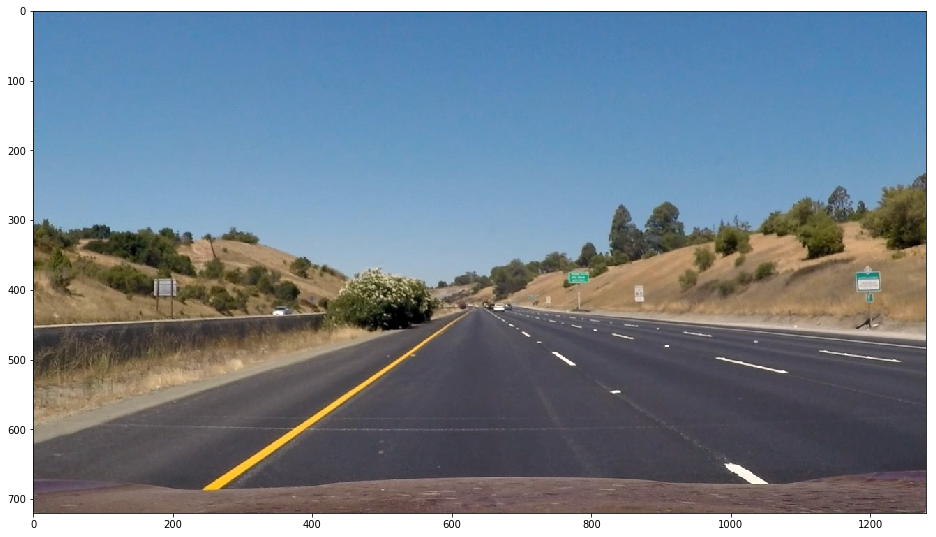

In [4]:
img = cv2.cvtColor(cv2.imread("test_images/straight_lines1.jpg"), cv2.COLOR_BGR2RGB)
plt.figure(figsize=(16, 16))
plt.imshow(img)

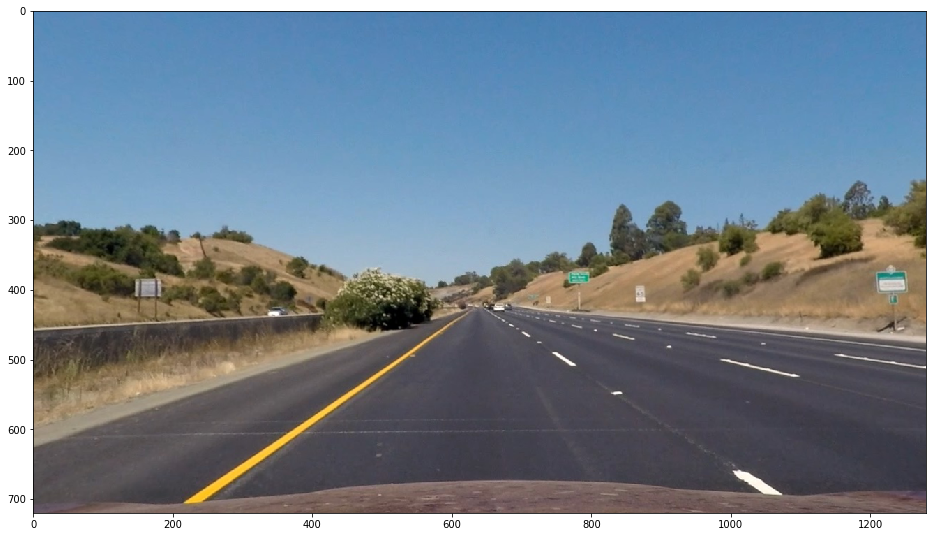

In [5]:
#img_udist = cv2.undistort(img, mtx, dist, None, mtx)
img_undistort = load_undistort_img("test_images/straight_lines1.jpg")
plt.figure(figsize=(16, 16))
plt.imshow(img_undistort)

### Perspective transformation

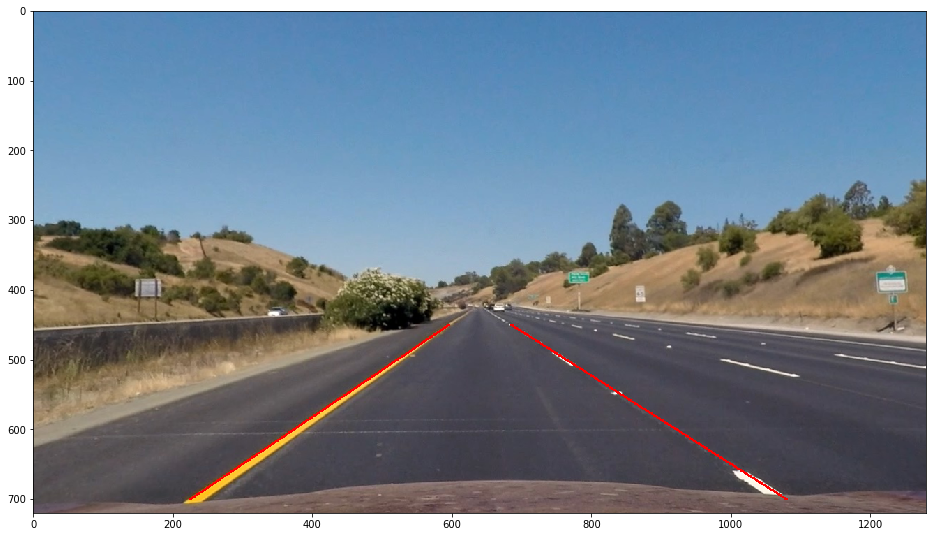

In [6]:
img = img_undistort.copy()
line_left = [(596, 450),  (225, 700)]
line_right = [(685, 450), (1080, 700)]
color=[255, 0, 0]
thickness = 2

cv2.line(img, line_left[0], line_left[1], color, thickness)
cv2.line(img, line_right[0], line_right[1], color, thickness)

plt.figure(figsize=(16, 16))
plt.imshow(img)

In [7]:
def warp_img(img, src_points):

    img_size = (img.shape[1], img.shape[0])
    src = np.float32(src_points)
    xoffset = 300
    yoffset = 50
    
    y_top, y_bottom = yoffset, img_size[1] - yoffset
    x_left, x_right = xoffset, img_size[0] - xoffset
    
    dst = np.float32([
        [x_left, y_top], [x_right, y_top], [x_right, y_bottom], [x_left, y_bottom]
    ])


    M = cv2.getPerspectiveTransform(src, dst)
    warped = cv2.warpPerspective(img, M, img_size, flags=cv2.INTER_LINEAR)
    return warped



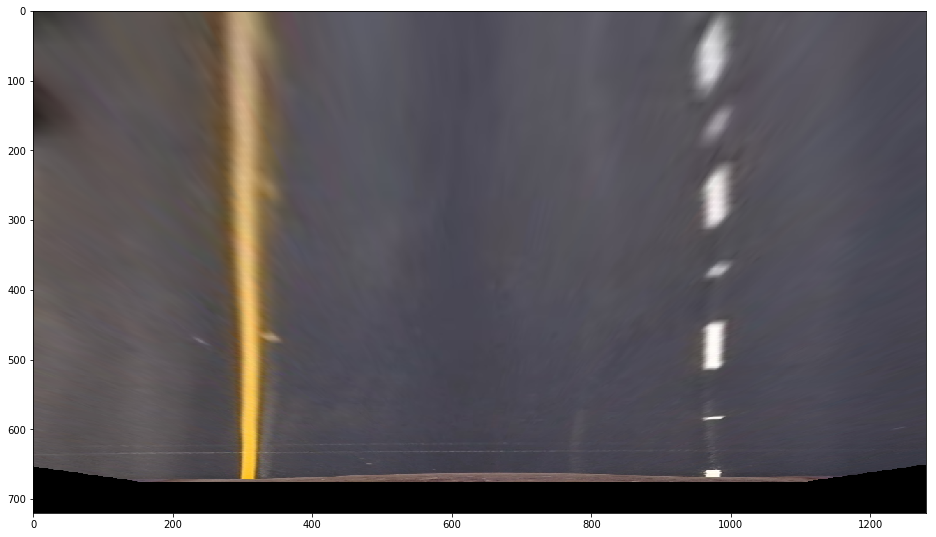

In [8]:
src_points = [line_left[0], line_right[0], line_right[1], line_left[1]]
warped = warp_img(img_undistort, src_points)
plt.figure(figsize=(16, 16))
plt.imshow(warped)

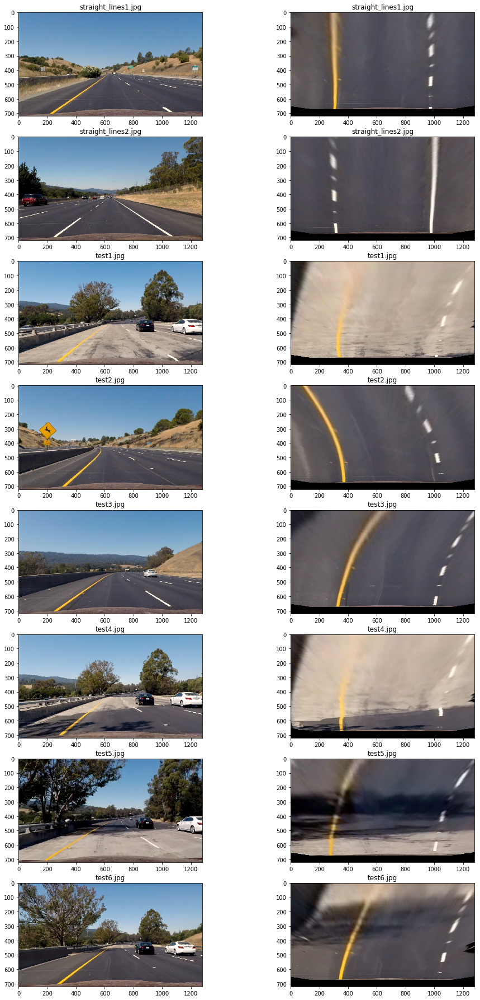

In [9]:
img_tests = glob.glob("./test_images/*.jpg")

n = len(img_tests)

plt.figure(figsize=(16, 32))
for i, img_path in enumerate(img_tests):
    
    img = load_undistort_img(img_path)
    warped = warp_img(img, src_points)
    ax = plt.subplot(n, 2, 2*i + 1)
    ax.set_title("{0}".format(Path(img_path).name))
    plt.imshow(img)
    
    ax = plt.subplot(n, 2, 2*i + 2)
    ax.set_title("{0}".format(Path(img_path).name))
    plt.imshow(warped)

## Binalization



In [10]:
def gray_conv(rgb_img, color_space='gray'):
    
    if color_space == 'gray':
        img = cv2.cvtColor(rgb_img, cv2.COLOR_RGB2GRAY)
    elif color_space == 'rgb_r':
        img = rgb_img[:, :, 0]
    elif color_space == 'rgb_g':
        img = rgb_img[:, :, 1]
    elif color_space == 'rgb_b':
        img = rgb_img[:, :, 2]
    elif color_space == 'hls_h':
        hls = cv2.cvtColor(rgb_img, cv2.COLOR_RGB2HLS)
        img = hls[:, :, 0]
    elif color_space == 'hls_l':
        hls = cv2.cvtColor(rgb_img, cv2.COLOR_RGB2HLS)
        img = hls[:, :, 1]
    elif color_space == 'hls_s':
        hls = cv2.cvtColor(rgb_img, cv2.COLOR_RGB2HLS)
        img = hls[:, :, 2]
    elif color_space == 'hsv_h':
        hsv = cv2.cvtColor(rgb_img, cv2.COLOR_RGB2HSV)
        img = hsv[:, :, 0]
    elif color_space == 'hsv_s':
        hsv = cv2.cvtColor(rgb_img, cv2.COLOR_RGB2HSV)
        img = hsv[:, :, 1]
    elif color_space == 'hsv_v':
        hsv = cv2.cvtColor(rgb_img, cv2.COLOR_RGB2HSV)
        img = hsv[:, :, 2]
    else:
        raise ValueError("{0} is unknown color_space".format(color_space))
    return img


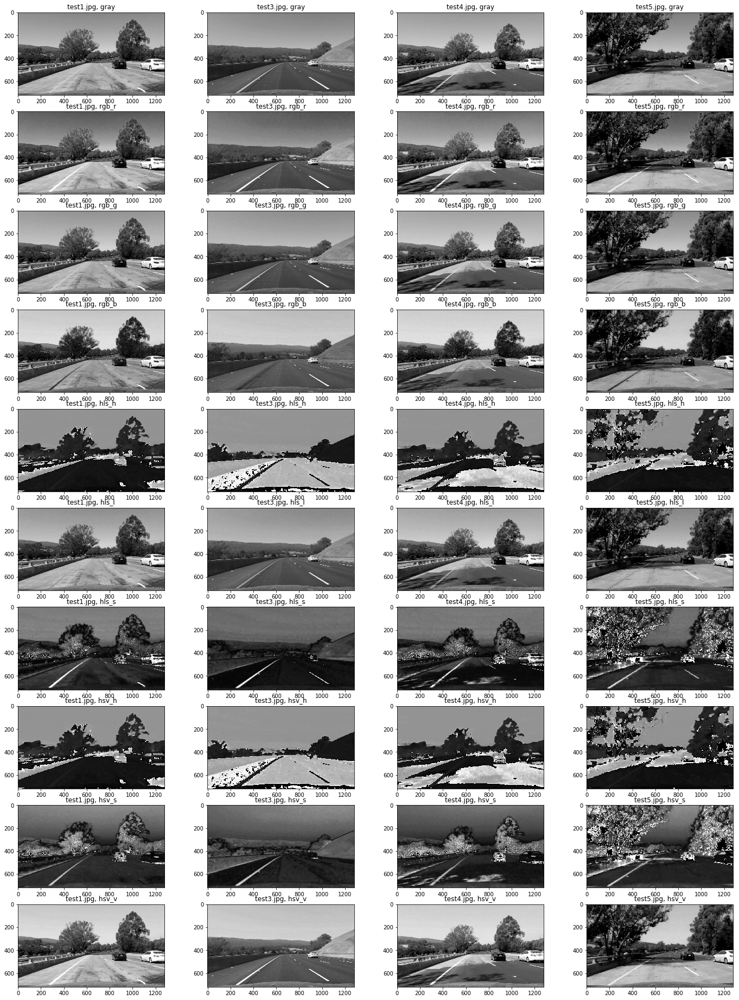

In [11]:
color_spaces = [
    'gray', 'rgb_r', 'rgb_g', 'rgb_b',
    'hls_h', 'hls_l', 'hls_s', 
    'hsv_h', 'hsv_s', 'hsv_v', 
]

img_test_samples = [
    "test_images/test1.jpg",
    "test_images/test3.jpg",
    "test_images/test4.jpg",
    "test_images/test5.jpg"
]

nx = len(img_test_samples)
ny = len(color_spaces)

plt.figure(figsize=(24, 33))
for i, img_path in enumerate(img_test_samples):
    img = load_undistort_img(img_path)
    
    for j, cs in enumerate(color_spaces):        
        gray = gray_conv(img, cs)
        
        ax = plt.subplot(ny, nx, nx*j + i + 1)
        ax.set_title("{0}, {1}".format(Path(img_path).name, cs))
        plt.imshow(gray, cmap='gray')

In [12]:

def abs_sobel_thresh(img, orient='x', sobel_kernel=3, thresh=(0, 255), color_space='gray'):
    # Calculate directional gradient
    # Apply threshold    
    gray = gray_conv(img, color_space=color_space)
    if orient == 'x':
        sobel = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    else:
        sobel = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    abs_sobel = np.absolute(sobel)
    scale_sobel = np.uint8(255*abs_sobel/abs_sobel.max())
    grad_binary = np.zeros_like(scale_sobel)
    grad_binary[(scale_sobel >=thresh[0]) & (scale_sobel <= thresh[1])] = 1
    return grad_binary

def mag_thresh(img, sobel_kernel=3, mag_thresh=(0, 255), color_space='gray'):
    # Calculate gradient magnitude
    # Apply threshold
    gray = gray_conv(img, color_space=color_space)
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)    
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    abs_sobel = np.sqrt(sobelx**2 + sobely**2)
    scale_sobel = np.uint8(255*abs_sobel/abs_sobel.max())
    mag_binary = np.zeros_like(scale_sobel)
    mag_binary[(scale_sobel >=mag_thresh[0]) & (scale_sobel <= mag_thresh[1])] = 1
    return mag_binary

def dir_thresh(img, sobel_kernel=3, dir_thresh=(0, np.pi/2), color_space='gray'):
    # Calculate gradient direction
    # Apply threshold
    gray = gray_conv(img, color_space=color_space)
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)    
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    dir_sobel = np.arctan2(np.absolute(sobely), np.absolute(sobelx))
    dir_binary = np.zeros_like(dir_sobel)
    dir_binary[(dir_sobel >=thresh[0]) & (dir_sobel <= thresh[1])] = 1

    return dir_binary

def color_channel_thresh(img, thresh=(0, 255), color_space='gray'):
    gray = gray_conv(img, color_space=color_space)
    binary = np.zeros_like(gray)
    binary[(gray >= thresh[0]) & (gray <= thresh[1])] = 1
    return binary


In [13]:
img_test = load_undistort_img("test_images/test5.jpg")

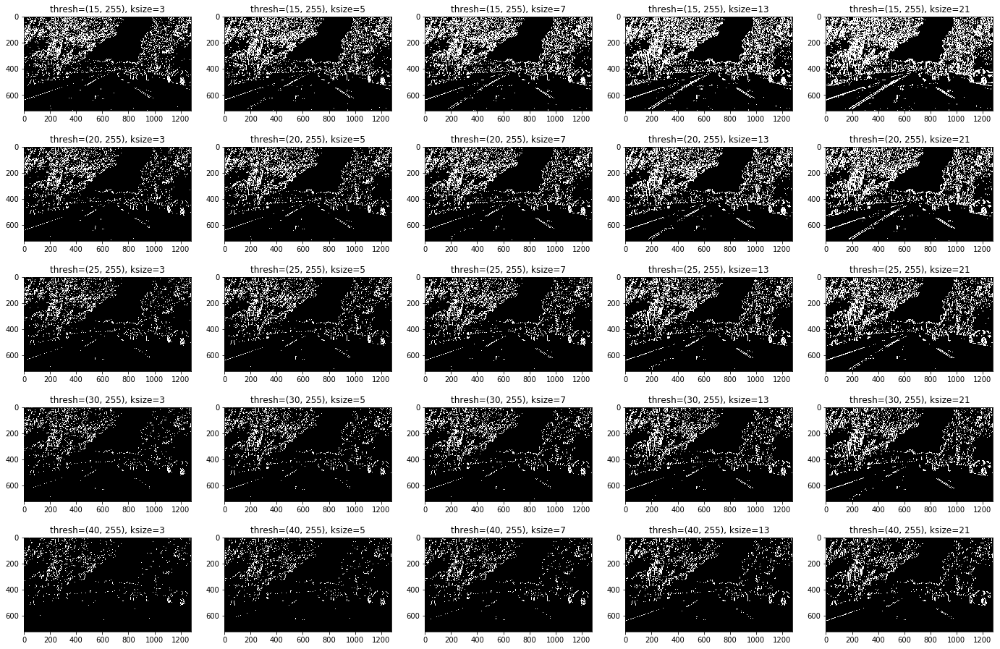

In [14]:
threshes = [(15, 255), (20, 255), (25, 255), (30, 255), (40, 255)]
ksizes = [3, 5, 7, 13, 21]
ny = len(threshes)
nx = len(ksizes)

plt.figure(figsize=(24, 16))
for i, thresh in enumerate(threshes):
    for j, ksize in enumerate(ksizes):
        ax = plt.subplot(ny, nx, nx*i + j + 1)
        res = abs_sobel_thresh(img_test, 'x', sobel_kernel=ksize, thresh=thresh, color_space='rgb_r')
        ax.set_title("thresh={0}, ksize={1}".format(thresh, ksize))
        plt.imshow(res, cmap='gray')

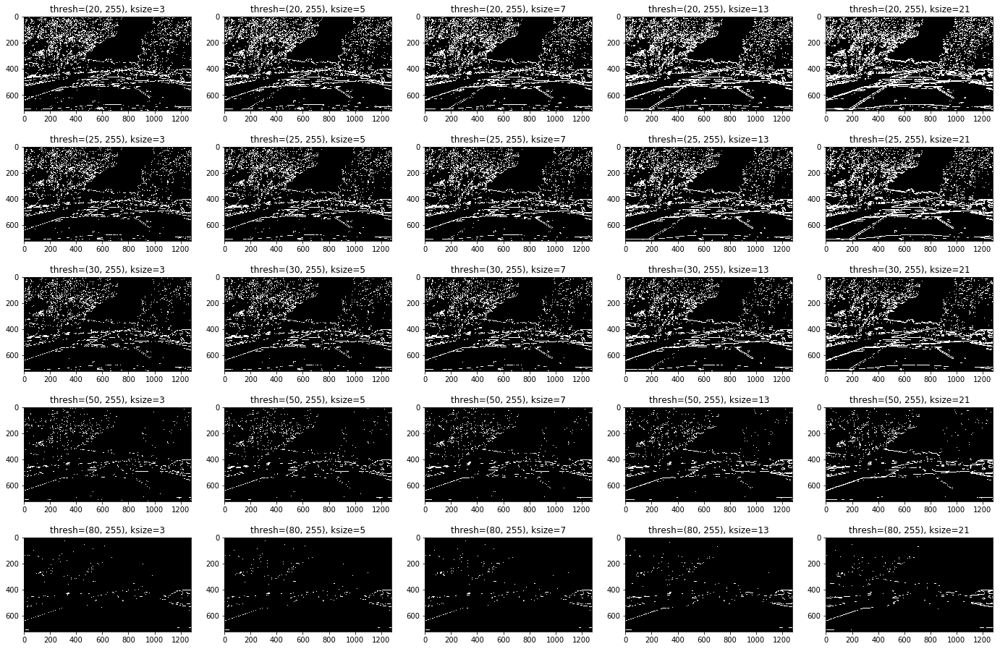

In [15]:
threshes = [(20, 255), (25, 255), (30, 255), (50, 255), (80, 255)]
ksizes = [3, 5, 7, 13, 21]
ny = len(threshes)
nx = len(ksizes)

plt.figure(figsize=(24, 16))
for i, thresh in enumerate(threshes):
    for j, ksize in enumerate(ksizes):
        ax = plt.subplot(ny, nx, nx*i + j + 1)
        res = abs_sobel_thresh(img_test, 'y', sobel_kernel=ksize, thresh=thresh, color_space='rgb_r')
        ax.set_title("thresh={0}, ksize={1}".format(thresh, ksize))
        plt.imshow(res, cmap='gray')

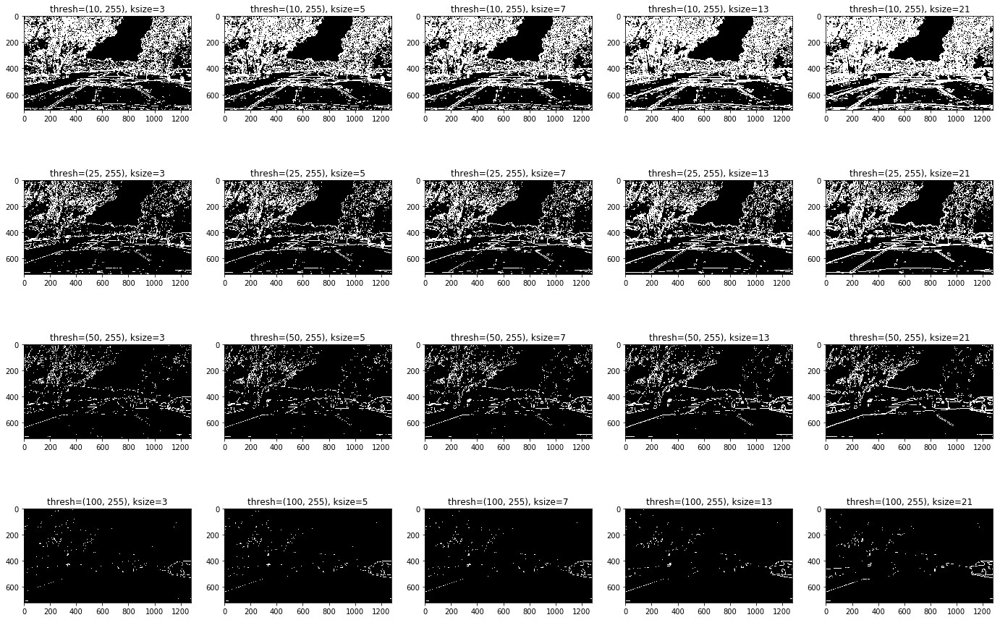

In [16]:
threshes = [(10, 255), (25, 255), (50, 255), (100, 255), ]
ksizes = [3, 5, 7, 13, 21]
ny = len(threshes)
nx = len(ksizes)

plt.figure(figsize=(24, 16))
for i, thresh in enumerate(threshes):
    for j, ksize in enumerate(ksizes):
        ax = plt.subplot(ny, nx, nx*i + j + 1)
        res = mag_thresh(img_test, sobel_kernel=ksize, mag_thresh=thresh, color_space='rgb_r')
        ax.set_title("thresh={0}, ksize={1}".format(thresh, ksize))
        plt.imshow(res, cmap='gray')

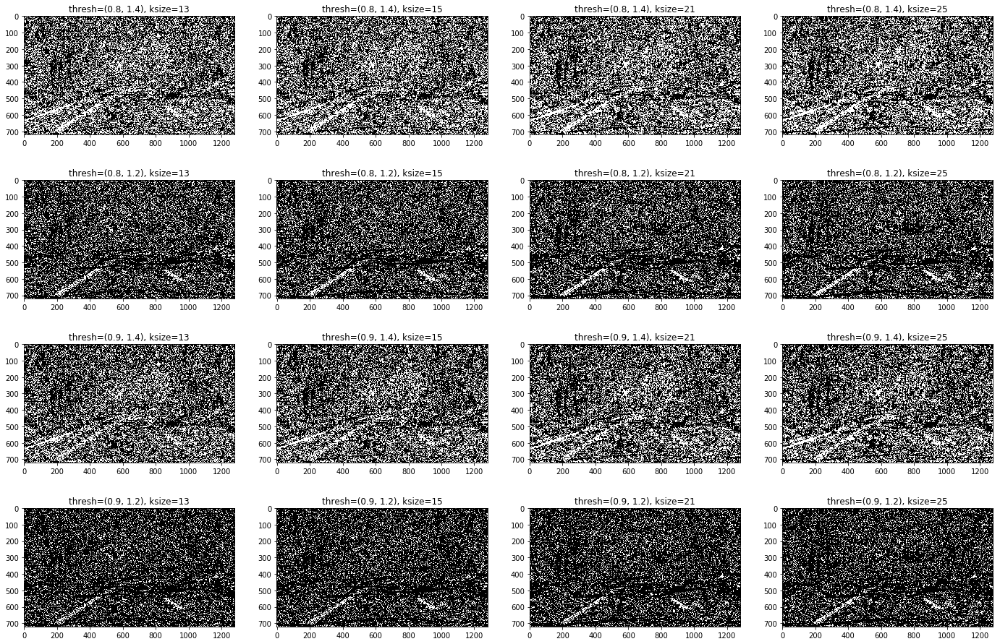

In [17]:
threshes = [(0.8, 1.4), (0.8, 1.2), (0.9, 1.4), (0.9, 1.2)]
ksizes = [13, 15, 21, 25]
ny = len(threshes)
nx = len(ksizes)

plt.figure(figsize=(24, 16))
for i, thresh in enumerate(threshes):
    for j, ksize in enumerate(ksizes):
        ax = plt.subplot(ny, nx, nx*i + j + 1)
        res = dir_thresh(img_test, sobel_kernel=ksize, dir_thresh=thresh, color_space='rgb_r')
        ax.set_title("thresh={0}, ksize={1}".format(thresh, ksize))
        plt.imshow(res, cmap='gray')

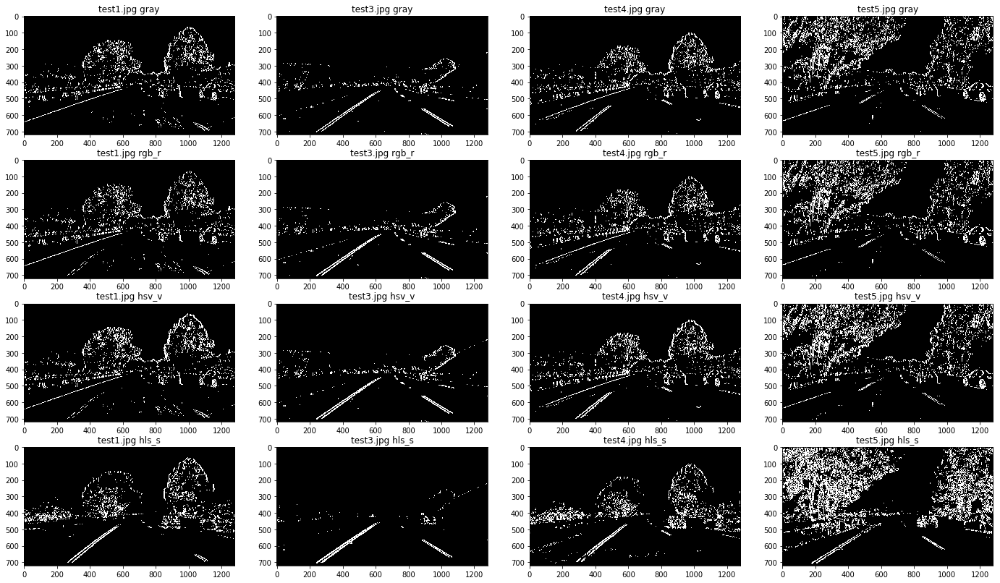

In [18]:
color_spaces = ['gray', 'rgb_r', 'hsv_v', 'hls_s']
ny = len(color_spaces)
nx=len(img_test_samples)

ksize = 13
thresh = (30, 255)

plt.figure(figsize=(24, 14))
for i, img_path in enumerate(img_test_samples):
    img = load_undistort_img(img_path)
    for j, cs in enumerate(color_spaces):
        ax = plt.subplot(ny, nx, nx*j + i + 1)
        res = abs_sobel_thresh(img, 'x', sobel_kernel=ksize, thresh=thresh, color_space=cs)
        ax.set_title("{0} {1}".format(Path(img_path).name,  cs))
        plt.imshow(res, cmap='gray')

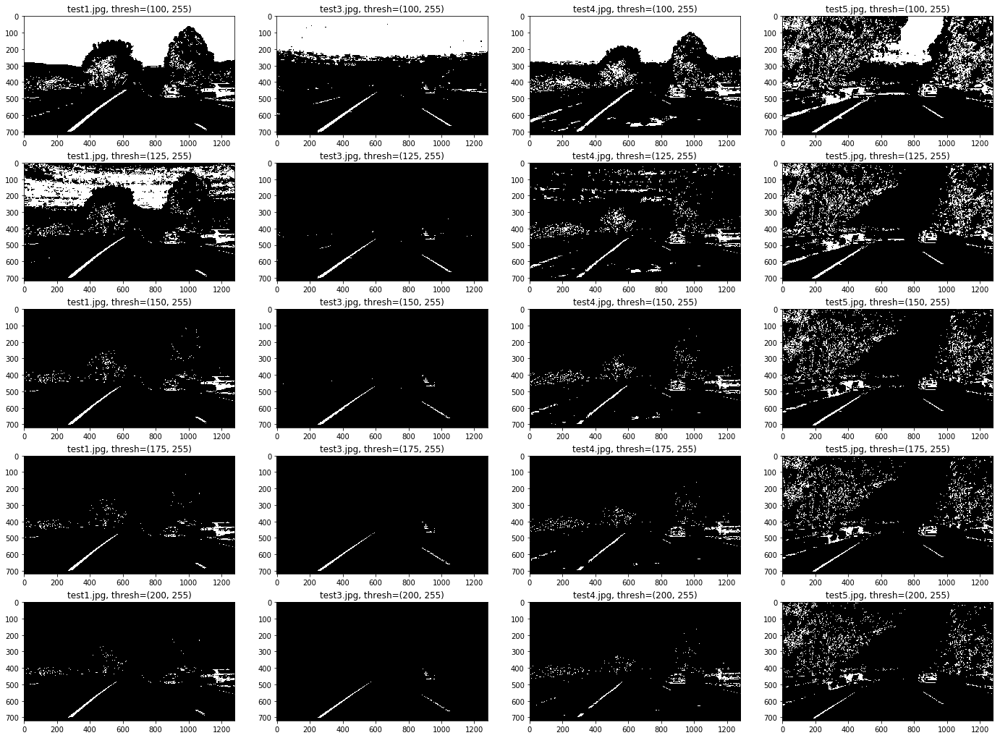

In [19]:
threshes = [(100, 255), (125, 255), (150, 255), (175, 255), (200, 255)]
ny = len(threshes)
nx=len(img_test_samples)

plt.figure(figsize=(24, 18))
for i, img_path in enumerate(img_test_samples):
    img = load_undistort_img(img_path)
    
    for j, thresh in enumerate(threshes):        
        ax = plt.subplot(ny, nx, nx*j + i + 1)
        res = color_channel_thresh(img, thresh=thresh, color_space='hls_s')
        ax.set_title("{0}, thresh={1}".format(Path(img_path).name, thresh))
        plt.imshow(res, cmap='gray')

In [20]:
def combined_binary(img):
    channel_thresh = (150, 255)
    thresh = (25, 255)
    ksize = 13
    ch_binary = color_channel_thresh(img, thresh=channel_thresh, color_space='hls_s')    
    binary = abs_sobel_thresh(img, orient='x', sobel_kernel=ksize, thresh=thresh, color_space='rgb_r')

    cl_binary = np.dstack(( np.zeros_like(binary), binary, ch_binary)) * 255
    cb_binary = np.zeros_like(ch_binary)
    cb_binary[(ch_binary == 1) | (binary == 1)] = 1
    return cb_binary, cl_binary

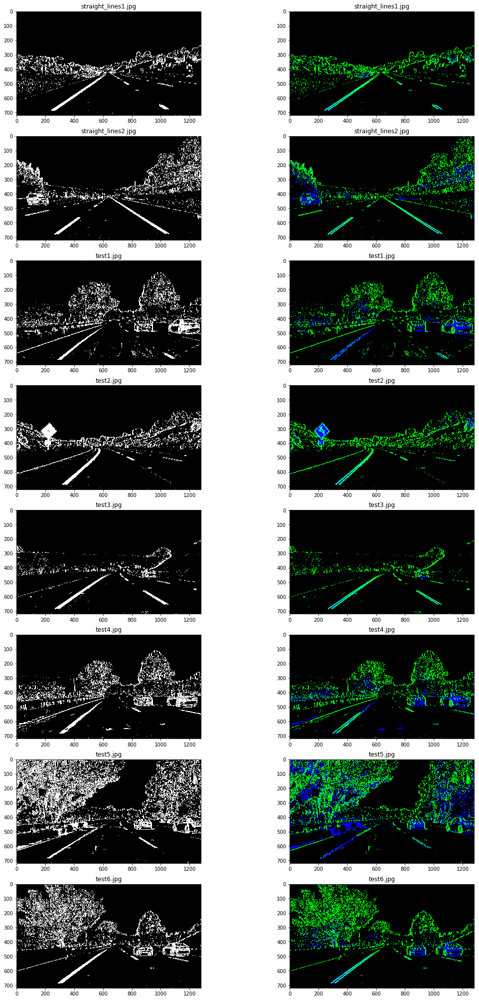

In [21]:
ny = len(img_tests)
nx = 2

plt.figure(figsize=(18,36))
for i, img_path in enumerate(img_tests):
        img = cv2.cvtColor(cv2.imread(img_path), cv2.COLOR_BGR2RGB)
        cb_binary, cl_binary = combined_binary(img)
        
        ax = plt.subplot(ny, nx, 2*i + 1)
        ax.set_title("{0}".format(Path(img_path).name))
        plt.imshow(cb_binary, cmap='gray')
        
        ax = plt.subplot(ny, nx, 2*i + 2)
        ax.set_title("{0}".format(Path(img_path).name))
        plt.imshow(cl_binary)


## Combines Perspective Transform and Binarlization

Here, I will apply two preprocessing, Perspective Transformation and Image Binalization.


In [22]:
def preprocess_1(img_path, src_points):
    img = load_undistort_img(img_path=img_path)
    img_binary, _ = combined_binary(img)
    img_warped = warp_img(img_binary, src_points)
    return img_undistort, img_binary, img_warped

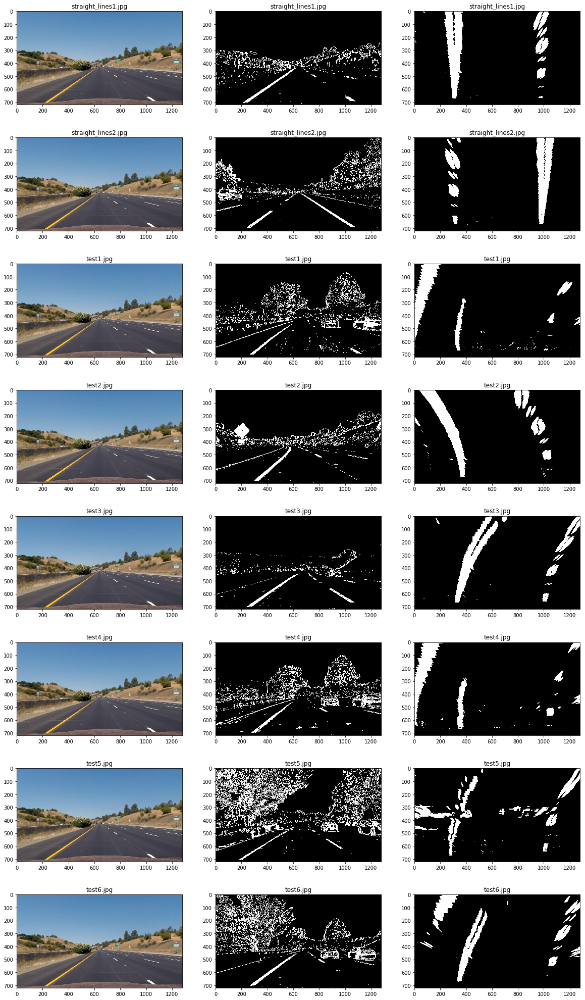

In [23]:
ny = len(img_tests)
nx = 3

plt.figure(figsize=(20,36))
for i, img_path in enumerate(img_tests):
    img_undistort, img_binary, img_warped = preprocess_1(img_path, src_points)
    
    ax = plt.subplot(ny, nx, nx*i + 1)
    ax.set_title("{0}".format(Path(img_path).name))
    plt.imshow(img_undistort, cmap='gray')

    ax = plt.subplot(ny, nx, nx*i + 2)
    ax.set_title("{0}".format(Path(img_path).name))
    plt.imshow(img_binary, cmap='gray')

    ax = plt.subplot(ny, nx, nx*i + 3)
    ax.set_title("{0}".format(Path(img_path).name))
    plt.imshow(img_warped, cmap='gray')
    

## Polynomial Fit

In [24]:
import matplotlib.gridspec as gridspec

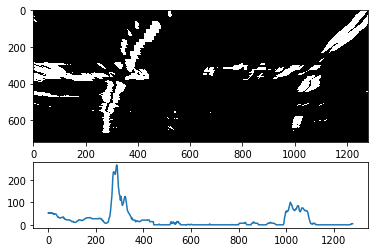

In [54]:
_, _, binary_warped = preprocess_1("test_images/test5.jpg", src_points)
histogram = np.sum(img_warped[img_warped.shape[0]//2:, :], axis=0)

gs = gridspec.GridSpec(2, 1, height_ratios=[2, 1])
ax1 = plt.subplot(gs[0])
plt.imshow(img_warped, cmap='gray', aspect="auto")
ax2 = plt.subplot(gs[1])
plt.plot(histogram)

In [55]:

out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
# Find the peak of the left and right halves of the histogram
# These will be the starting point for the left and right lines
midpoint = np.int(histogram.shape[0]/2)
leftx_base = np.argmax(histogram[:midpoint])
rightx_base = np.argmax(histogram[midpoint:]) + midpoint

# Choose the number of sliding windows
nwindows = 9
# Set height of windows
window_height = np.int(binary_warped.shape[0]/nwindows)
# Identify the x and y positions of all nonzero pixels in the image
nonzero = binary_warped.nonzero()
nonzeroy = np.array(nonzero[0])
nonzerox = np.array(nonzero[1])
# Current positions to be updated for each window
leftx_current = leftx_base
rightx_current = rightx_base
# Set the width of the windows +/- margin
margin = 100
# Set minimum number of pixels found to recenter window
minpix = 50
# Create empty lists to receive left and right lane pixel indices
left_lane_inds = []
right_lane_inds = []

# Step through the windows one by one
for window in range(nwindows):
    # Identify window boundaries in x and y (and right and left)
    win_y_low = binary_warped.shape[0] - (window+1)*window_height
    win_y_high = binary_warped.shape[0] - window*window_height
    win_xleft_low = leftx_current - margin
    win_xleft_high = leftx_current + margin
    win_xright_low = rightx_current - margin
    win_xright_high = rightx_current + margin
    # Draw the windows on the visualization image

    cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),
    color=(0,255,0), thickness=2) 
    cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),
    color=(0,255,0), thickness=2) 
    # Identify the nonzero pixels in x and y within the window
    good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
    (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
    good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
    (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
    # Append these indices to the lists
    left_lane_inds.append(good_left_inds)
    right_lane_inds.append(good_right_inds)
    # If you found > minpix pixels, recenter next window on their mean position
    if len(good_left_inds) > minpix:
        leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
    if len(good_right_inds) > minpix:        
        rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

# Concatenate the arrays of indices
left_lane_inds = np.concatenate(left_lane_inds)
right_lane_inds = np.concatenate(right_lane_inds)

# Extract left and right line pixel positions
leftx = nonzerox[left_lane_inds]
lefty = nonzeroy[left_lane_inds] 
rightx = nonzerox[right_lane_inds]
righty = nonzeroy[right_lane_inds] 

# Fit a second order polynomial to each
left_fit = np.polyfit(lefty, leftx, 2)
right_fit = np.polyfit(righty, rightx, 2)

(720, 0)

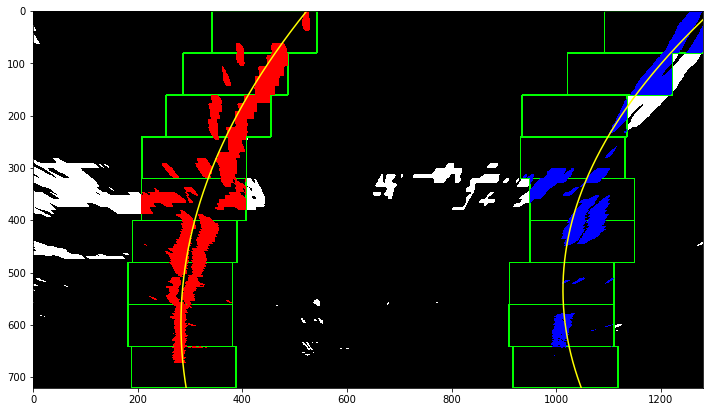

In [56]:
# Generate x and y values for plotting
plt.figure(figsize=(12, 8))
ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
plt.imshow(out_img)
plt.plot(left_fitx, ploty, color='yellow')
plt.plot(right_fitx, ploty, color='yellow')
plt.xlim(0, 1280)
plt.ylim(720, 0)

In [57]:
# Assume you now have a new warped binary image 
# from the next frame of video (also called "binary_warped")
# It's now much easier to find line pixels!
nonzero = binary_warped.nonzero()
nonzeroy = np.array(nonzero[0])
nonzerox = np.array(nonzero[1])
margin = 100
left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + 
left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + 
left_fit[1]*nonzeroy + left_fit[2] + margin))) 

right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + 
right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + 
right_fit[1]*nonzeroy + right_fit[2] + margin)))  

# Again, extract left and right line pixel positions
leftx = nonzerox[left_lane_inds]
lefty = nonzeroy[left_lane_inds] 
rightx = nonzerox[right_lane_inds]
righty = nonzeroy[right_lane_inds]
# Fit a second order polynomial to each
left_fit = np.polyfit(lefty, leftx, 2)
right_fit = np.polyfit(righty, rightx, 2)
# Generate x and y values for plotting
ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

(720, 0)

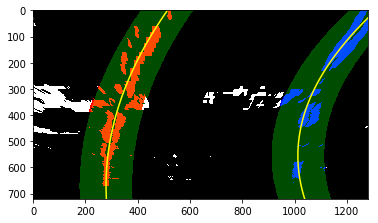

In [58]:
# Create an image to draw on and an image to show the selection window
out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
window_img = np.zeros_like(out_img)
# Color in left and right line pixels
out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

# Generate a polygon to illustrate the search window area
# And recast the x and y points into usable format for cv2.fillPoly()
left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, 
                              ploty])))])
left_line_pts = np.hstack((left_line_window1, left_line_window2))
right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, 
                              ploty])))])
right_line_pts = np.hstack((right_line_window1, right_line_window2))

# Draw the lane onto the warped blank image
cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
plt.imshow(result)
plt.plot(left_fitx, ploty, color='yellow')
plt.plot(right_fitx, ploty, color='yellow')
plt.xlim(0, 1280)
plt.ylim(720, 0)


## Measturing curvature

In [69]:
# get evaluation point
y_eval = np.max(ploty)

# Define conversions in x and y from pixels space to meters
ym_per_pix = 30/720 # meters per pixel in y dimension
xm_per_pix = 3.7/700 # meters per pixel in x dimension

# Fit new polynomials to x,y in world space
left_fit_cr = np.polyfit(lefty*ym_per_pix, leftx*xm_per_pix, 2)
right_fit_cr = np.polyfit(righty*ym_per_pix, rightx*xm_per_pix, 2)
# Calculate the new radii of curvature
left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
# Now our radius of curvature is in meters
print(left_curverad, 'm', right_curverad, 'm')
# Example values: 632.1 m    626.2 m

314.584176054 m 170.801513916 m


## Sliding window

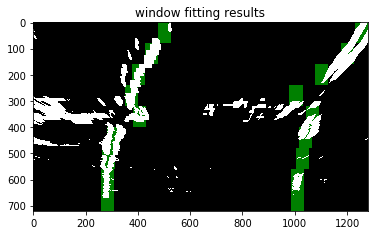

In [61]:
# Read in a thresholded image

# window settings
window_width = 50 
window_height = 80 # Break image into 9 vertical layers since image height is 720
margin = 100 # How much to slide left and right for searching

def window_mask(width, height, img_ref, center,level):
    output = np.zeros_like(img_ref)
    output[int(img_ref.shape[0]-(level+1)*height):int(img_ref.shape[0]-level*height),max(0,int(center-width/2)):min(int(center+width/2),img_ref.shape[1])] = 1
    return output

def find_window_centroids(image, window_width, window_height, margin):
    
    window_centroids = [] # Store the (left,right) window centroid positions per level
    window = np.ones(window_width) # Create our window template that we will use for convolutions
    
    # First find the two starting positions for the left and right lane by using np.sum to get the vertical image slice
    # and then np.convolve the vertical image slice with the window template 
    
    # Sum quarter bottom of image to get slice, could use a different ratio
    l_sum = np.sum(image[int(3*image.shape[0]/4):,:int(image.shape[1]/2)], axis=0)
    l_center = np.argmax(np.convolve(window,l_sum))-window_width/2
    r_sum = np.sum(image[int(3*image.shape[0]/4):,int(image.shape[1]/2):], axis=0)
    r_center = np.argmax(np.convolve(window,r_sum))-window_width/2+int(image.shape[1]/2)
    
    # Add what we found for the first layer
    window_centroids.append((l_center,r_center))
    
    # Go through each layer looking for max pixel locations
    for level in range(1,(int)(image.shape[0]/window_height)):
        # convolve the window into the vertical slice of the image
        image_layer = np.sum(image[int(image.shape[0]-(level+1)*window_height):int(image.shape[0]-level*window_height),:], axis=0)
        conv_signal = np.convolve(window, image_layer)
        # Find the best left centroid by using past left center as a reference
        # Use window_width/2 as offset because convolution signal reference is at right side of window, not center of window
        offset = window_width/2
        l_min_index = int(max(l_center+offset-margin,0))
        l_max_index = int(min(l_center+offset+margin,image.shape[1]))
        l_center = np.argmax(conv_signal[l_min_index:l_max_index])+l_min_index-offset
        # Find the best right centroid by using past right center as a reference
        r_min_index = int(max(r_center+offset-margin,0))
        r_max_index = int(min(r_center+offset+margin,image.shape[1]))
        r_center = np.argmax(conv_signal[r_min_index:r_max_index])+r_min_index-offset
        # Add what we found for that layer
        window_centroids.append((l_center,r_center))

    return window_centroids


window_centroids = find_window_centroids(binary_warped, window_width, window_height, margin)

# If we found any window centers
if len(window_centroids) > 0:
    # Points used to draw all the left and right windows
    l_points = np.zeros_like(binary_warped)
    r_points = np.zeros_like(binary_warped)

    # Go through each level and draw the windows 	
    for level in range(0,len(window_centroids)):
        # Window_mask is a function to draw window areas
        l_mask = window_mask(window_width,window_height,binary_warped,window_centroids[level][0],level)
        r_mask = window_mask(window_width,window_height,binary_warped,window_centroids[level][1],level)
        # Add graphic points from window mask here to total pixels found 
        l_points[(l_points == 255) | ((l_mask == 1) ) ] = 255
        r_points[(r_points == 255) | ((r_mask == 1) ) ] = 255

    # Draw the results
    template = np.array(r_points+l_points,np.uint8) # add both left and right window pixels together
    zero_channel = np.zeros_like(template) # create a zero color channel
    template = np.array(cv2.merge((zero_channel,template,zero_channel)),np.uint8) # make window pixels green
    warpage= np.dstack((binary_warped, binary_warped, binary_warped))*255 # making the original road pixels 3 color channels
    output = cv2.addWeighted(warpage, 1, template, 0.5, 0.0) # overlay the orignal road image with window results    

# If no window centers found, just display orginal road image
else:
    output = np.array(cv2.merge((binary_warped,binary_warped,binary_warped)),np.uint8)

# Display the final results
plt.imshow(output)
plt.title('window fitting results')
plt.show()